In [1]:
import pandas as pd
#import matplotlib.pylot as plt
import plotly.express as px

In [2]:
import os #Check directories and confirm files are in place
os.chdir("C:/Users/danby/Documents/My Projects/ex_1")
print('Current working directory:', os.getcwd())
print('Files in current directory', os.listdir('.'))

Current working directory: C:\Users\danby\Documents\My Projects\ex_1
Files in current directory ['.git', '.gitignore', '.ipynb_checkpoints', '.venv', '.vscode', 'app.py', 'my_script.py', 'README.md', 'untitled.py', 'vehicles_us.csv']


In [3]:
df = pd.read_csv('vehicles_us.csv') #Create dataframe and load up data files

In [4]:
print(df)
print(df.info(show_counts=True))
print(df.duplicated().sum())
print(df.isnull().sum())


       price  model_year           model  condition  cylinders fuel  odometer  \
0       9400      2011.0          bmw x5       good        6.0  gas  145000.0   
1      25500         NaN      ford f-150       good        6.0  gas   88705.0   
2       5500      2013.0  hyundai sonata   like new        4.0  gas  110000.0   
3       1500      2003.0      ford f-150       fair        8.0  gas       NaN   
4      14900      2017.0    chrysler 200  excellent        4.0  gas   80903.0   
...      ...         ...             ...        ...        ...  ...       ...   
51520   9249      2013.0   nissan maxima   like new        6.0  gas   88136.0   
51521   2700      2002.0     honda civic    salvage        4.0  gas  181500.0   
51522   3950      2009.0  hyundai sonata  excellent        4.0  gas  128000.0   
51523   7455      2013.0  toyota corolla       good        4.0  gas  139573.0   
51524   6300      2014.0   nissan altima       good        4.0  gas       NaN   

      transmission    type 

In [5]:
df['model_year'] = df['model_year'].fillna('0', inplace=False) # Fill missing values with 'Unknown'
df['cylinders'] = df['cylinders'].fillna('0', inplace=False)
df['odometer'] = df['odometer'].fillna('NaN', inplace=False)
df['paint_color'] = df['paint_color'].fillna('Unknown', inplace=False)
df['is_4wd'] = df['is_4wd'].fillna('0', inplace=False)
print(df)

       price model_year           model  condition cylinders fuel  odometer  \
0       9400     2011.0          bmw x5       good       6.0  gas  145000.0   
1      25500          0      ford f-150       good       6.0  gas   88705.0   
2       5500     2013.0  hyundai sonata   like new       4.0  gas  110000.0   
3       1500     2003.0      ford f-150       fair       8.0  gas       NaN   
4      14900     2017.0    chrysler 200  excellent       4.0  gas   80903.0   
...      ...        ...             ...        ...       ...  ...       ...   
51520   9249     2013.0   nissan maxima   like new       6.0  gas   88136.0   
51521   2700     2002.0     honda civic    salvage       4.0  gas  181500.0   
51522   3950     2009.0  hyundai sonata  excellent       4.0  gas  128000.0   
51523   7455     2013.0  toyota corolla       good       4.0  gas  139573.0   
51524   6300     2014.0   nissan altima       good       4.0  gas       NaN   

      transmission    type paint_color is_4wd date_

In [6]:
df.isnull().sum()

price           0
model_year      0
model           0
condition       0
cylinders       0
fuel            0
odometer        0
transmission    0
type            0
paint_color     0
is_4wd          0
date_posted     0
days_listed     0
dtype: int64

In [7]:
print("Model Year:")
print(df['model_year'].describe())

Model Year:
count     51525
unique       69
top           0
freq       3619
Name: model_year, dtype: object


In [8]:
print("\nCylinders:")
print(df['cylinders'].describe())


Cylinders:
count     51525.0
unique        8.0
top           8.0
freq      15844.0
Name: cylinders, dtype: float64


In [9]:
print("\nOdometer:")
print(df['odometer'].describe())


Odometer:
count     51525
unique    17763
top         NaN
freq       7892
Name: odometer, dtype: object


In [10]:
print("\nis_4wd:")
print(df['is_4wd'].describe())


is_4wd:
count     51525
unique        2
top           0
freq      25953
Name: is_4wd, dtype: object


In [11]:
# Check the shape of original data
print("Original data shape:", df.shape)

# Look at the first few rows of these specific columns
print("\nFirst 10 rows of key columns:")
print(df[['model_year', 'cylinders', 'is_4wd']].head(10))

# Check for 0 values in each column
print("\nCount of 0 values in each column:")
print("model_year zeros:", (df['model_year'] == 0).sum())
print("cylinders zeros:", (df['cylinders'] == 0).sum()) 
print("is_4wd zeros:", (df['is_4wd'] == 0).sum())

Original data shape: (51525, 13)

First 10 rows of key columns:
  model_year cylinders is_4wd
0     2011.0       6.0    1.0
1          0       6.0    1.0
2     2013.0       4.0      0
3     2003.0       8.0      0
4     2017.0       4.0      0
5     2014.0       6.0    1.0
6     2015.0       4.0      0
7     2013.0       6.0    1.0
8     2012.0       4.0    1.0
9     2008.0         0    1.0

Count of 0 values in each column:
model_year zeros: 0
cylinders zeros: 0
is_4wd zeros: 0


In [12]:
# Check data types
print("Data types:")
print(df[['model_year', 'cylinders', 'is_4wd']].dtypes)

# Check for actual zero values more carefully
print("\nActual zero counts:")
print("model_year == 0:", (df['model_year'] == 0).sum())
print("cylinders == 0:", (df['cylinders'] == 0).sum())
print("is_4wd == 0:", (df['is_4wd'] == 0).sum())

# Check unique values in is_4wd to understand what it represents
print("\nUnique values in is_4wd:")
print((df['is_4wd'].unique()))

Data types:
model_year    object
cylinders     object
is_4wd        object
dtype: object

Actual zero counts:
model_year == 0: 0
cylinders == 0: 0
is_4wd == 0: 0

Unique values in is_4wd:
[1.0 '0']


In [13]:
# Check what the zero values look like as text
print("Sample of model_year values:")
print(df['model_year'].value_counts().head(10))

print("\nSample of cylinders values:")
print(df['cylinders'].value_counts().head(10))

print("\nSample of is_4wd values:")
print(df['is_4wd'].value_counts())

Sample of model_year values:
model_year
0         3619
2013.0    3549
2012.0    3468
2014.0    3448
2011.0    3375
2015.0    3323
2016.0    2954
2008.0    2924
2010.0    2691
2007.0    2643
Name: count, dtype: int64

Sample of cylinders values:
cylinders
8.0     15844
6.0     15700
4.0     13864
0        5260
10.0      549
5.0       272
3.0        34
12.0        2
Name: count, dtype: int64

Sample of is_4wd values:
is_4wd
0      25953
1.0    25572
Name: count, dtype: int64


In [14]:
# Filter out columns with invalid values
clean_df = df[((df['model_year'] != 0) & (df['cylinders'] != 0))]
clean_df
print("Before:", len(df))
print("After:", len(clean_df))

Before: 51525
After: 51525


In [15]:
# Check the data types
print(clean_df['odometer'].dtype)

# Look for non-numeric values
print(clean_df['odometer'].value_counts().tail(10))

# Check for missing values
print(clean_df['odometer'].isnull().sum())

object
odometer
139314.0    1
108927.0    1
106212.0    1
199201.0    1
15804.0     1
71659.0     1
206257.0    1
166161.0    1
46621.0     1
187900.0    1
Name: count, dtype: int64
0


In [16]:
# Check what non-numeric values exist
non_numeric = clean_df[pd.to_numeric(clean_df['odometer'], errors='coerce').isnull()]
print("Non-numeric odometer values:")
print(non_numeric['odometer'].value_counts())

Non-numeric odometer values:
odometer
NaN    7892
Name: count, dtype: int64


In [17]:
# Convert to numeric, replacing any non-numeric values with NaN
clean_df.loc[:, 'odometer'] = pd.to_numeric(clean_df['odometer'], errors='coerce')

# Remove rows where odometer is NaN (if you want to)
clean_df = clean_df.dropna(subset=['odometer'])
clean_df

,price,model_year,model,condition,cylinders,fuel,odometer,transmission,type,paint_color,is_4wd,date_posted,days_listed
0,9400,2011.0,bmw x5,good,6.0,gas,145000.0,automatic,SUV,Unknown,1.0,2018-06-23,19
1,25500,0,ford f-150,good,6.0,gas,88705.0,automatic,pickup,white,1.0,2018-10-19,50
2,5500,2013.0,hyundai sonata,like new,4.0,gas,110000.0,automatic,sedan,red,0,2019-02-07,79
4,14900,2017.0,chrysler 200,excellent,4.0,gas,80903.0,automatic,sedan,black,0,2019-04-02,28
5,14990,2014.0,chrysler 300,excellent,6.0,gas,57954.0,automatic,sedan,black,1.0,2018-06-20,15
...,...,...,...,...,...,...,...,...,...,...,...,...,...
51518,3750,2005.0,ford taurus,excellent,6.0,gas,110200.0,automatic,sedan,silver,0,2018-08-10,63
51520,9249,2013.0,nissan maxima,like new,6.0,gas,88136.0,automatic,sedan,black,0,2018-10-03,37
51521,2700,2002.0,honda civic,salvage,4.0,gas,181500.0,automatic,sedan,white,0,2018-11-14,22
51522,3950,2009.0,hyundai sonata,excellent,4.0,gas,128000.0,automatic,sedan,blue,0,2018-11-15,32


In [18]:
print(clean_df['odometer'].dtype)
print(clean_df['odometer'].head())
print(clean_df['odometer'].isnull().sum())
print(clean_df['odometer'].unique()[:10])  # Show first 10 unique values

object
0    145000.0
1     88705.0
2    110000.0
4     80903.0
5     57954.0
Name: odometer, dtype: object
0
[145000.0 88705.0 110000.0 80903.0 57954.0 79212.0 109473.0 104174.0
 147191.0 128413.0]


In [19]:
# Convert odometer from text to actual numbers
clean_df['odometer'] = pd.to_numeric(clean_df['odometer'], errors='coerce')

# Now check the data type
print(clean_df['odometer'].dtype)  # Should show 'float64'

float64


In [20]:
print(clean_df['odometer'].dtype) # Should be 'float64' or 'int64'
print(clean_df['odometer'].head())  # Should show numbers without quotes

float64
0    145000.0
1     88705.0
2    110000.0
4     80903.0
5     57954.0
Name: odometer, dtype: float64


In [21]:
# Car prices
fig = px.histogram(clean_df, x='price')
fig.show()

In [22]:
# Distribution of car years
fig = px.histogram(clean_df, x='model_year', title='Distribution of Model Year')
fig.show()

In [23]:
# Distribution of odometer readings
fig = px.histogram(clean_df, x='odometer', title='Distribution of Mileage')
fig.show()

In [24]:
fig = px.histogram(clean_df, x='days_listed', title='Days lists')
fig.show()

In [25]:
# Price vs Year relationship
# Two columns: one for x-axis, one for y-axis
fig = px.scatter(clean_df, x='model_year', y='price', 
                 title='Price vs Year')
fig.show()

In [26]:
# Price vs Year by Fuel Type relationship
# Three columns: x, y, and color
fig = px.scatter(clean_df, x='model_year', y='price', color='fuel',
                 title='Price vs Year by Fuel Type')
fig.show()

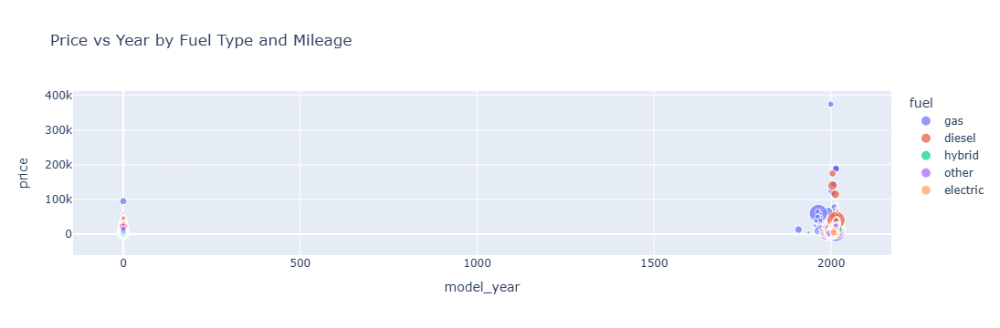

In [27]:
# Four columns: x, y, color, and size
fig = px.scatter(clean_df, x='model_year', y='price', color='fuel', size='odometer',
                 title='Price vs Year by Fuel Type and Mileage')
fig.show()